In [1]:
import census_utils 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image
from sklearn import datasets, tree, metrics, model_selection, ensemble, neural_network
from sklearn.preprocessing import StandardScaler
from sklearn.externals.six import StringIO
from tensorflow.keras import models, layers, datasets, utils, optimizers

/Users/tom/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


# Data Extraction

In [2]:
# ensure descriptions are not truncated 
pd.set_option('display.max_colwidth', -1)

In [3]:
lookup = pd.read_pickle('../lookup/lookuptable.pkl') 

In [4]:
lookup.head()

,TableCode,TableDescription,CatCode,CatDescription
UniqueCatCode,,,,
DC5202SC0001,DC5202SC,Highest level of qualification by ethnic group by age,0001,All people aged 16 and over:_Total_All people aged 16 and over
DC5202SC0002,DC5202SC,Highest level of qualification by ethnic group by age,0002,All people aged 16 and over:_Total_White: Total
DC5202SC0003,DC5202SC,Highest level of qualification by ethnic group by age,0003,All people aged 16 and over:_Total_White: Scottish
DC5202SC0004,DC5202SC,Highest level of qualification by ethnic group by age,0004,All people aged 16 and over:_Total_White: Other British
DC5202SC0005,DC5202SC,Highest level of qualification by ethnic group by age,0005,All people aged 16 and over:_Total_White: Irish


In [5]:
lookup[lookup.TableCode == 'LC4428SC'].head(20)

,TableCode,TableDescription,CatCode,CatDescription
UniqueCatCode,,,,
LC4428SC0001,LC4428SC,Accommodation type by tenure - People,0001,All people in households_All people in households
LC4428SC0002,LC4428SC,Accommodation type by tenure - People,0002,All people in households_Owned: Total
LC4428SC0003,LC4428SC,Accommodation type by tenure - People,0003,All people in households_Owned: Owned outright
LC4428SC0004,LC4428SC,Accommodation type by tenure - People,0004,All people in households_Owned: Owned with a mortgage or loan or shared ownership
LC4428SC0005,LC4428SC,Accommodation type by tenure - People,0005,All people in households_Rented or living rent free: Total
LC4428SC0006,LC4428SC,Accommodation type by tenure - People,0006,All people in households_Rented or living rent free: Social rented
LC4428SC0007,LC4428SC,Accommodation type by tenure - People,0007,All people in households_Rented or living rent free: Private rented or living rent free
LC4428SC0008,LC4428SC,Accommodation type by tenure - People,0008,Whole house or bungalow: Total_All people in households
LC4428SC0009,LC4428SC,Accommodation type by tenure - People,0009,Whole house or bungalow: Total_Owned: Total


In [6]:

requested = { 
    'LC6107SC': ['0005'], #All people aged 16 and over_Economically active: Unemployed 
    'LC2107SC': ['0011'], #Total people no religion
    'LC3102SC': ['0002'], #Health - All people:_Total_Very good health
    'LC4428SC': ['0004'], #House owned with a mortgage or loan or shared ownership  
    'LC1109SC': ['0007']  #All people in households_One family household: Married couple: Total
            }
norm = { 
    'LC6107SC' : { '0005':'0001' }, #Normalised by all people
    'LC2107SC' : { '0011':'0001' }, #Normaliesd to all people
    'LC3102SC' : { '0002':'0001' }, #Normalised by all people
    'LC4428SC' : { '0004':'0001' }, #Normalised by all people in households
    'LC1109SC' : { '0007':'0001' }  #Normalised by all households 
}

In [7]:
features = census_utils.extractdata(requested, norm)

In [8]:
features.head()

,LC6107SC0005,LC2107SC0011,LC3102SC0002,LC4428SC0004,LC1109SC0007
ONSCode,,,,,
S29000001,0.041392,0.522767,0.596760,0.244298,0.196053
S29000002,0.031356,0.470616,0.606780,0.404191,0.361337
S29000003,0.040323,0.478135,0.511739,0.323750,0.367841
S29000004,0.064591,0.530458,0.566577,0.188781,0.153182
S29000005,0.043647,0.500156,0.638076,0.320215,0.226053


In [9]:
features.shape

(1012, 5)

We investigate each category by first looking at choropleth maps and visually identifying if there are any area specific trends. 

# Visualisation

In [10]:
census_utils.genchoropleth(features, 'LC6107SC0005')

This first choropleth map shows all the unemployed people in scotland. The trend of high unemployment in cities can be seen above with Glasgow and the surrounding areas having the highest unemployment. This is in line with what one would predict.

In [11]:
census_utils.genchoropleth(features, 'LC2107SC0011')

The choropleth map above shows the distributions of people without religon across Scotland. It has a somewhat surprising distribution as the highest densities of people without religion is on the east coast of scotland with a large proportion surrounding Edinburgh. 

In [12]:
census_utils.genchoropleth(features, 'LC3102SC0002')

The choropleth map shows the density of people with very good health. Due to most of Scotland having access to good free healthcare you would assume that cities would have the lowest levels of health due to polution and jobs that require being sedentary. This can be seen very clearly in Glasgow and Aberdeen specifially, in Aberdeen the city itself has got a low health level but directly around it, it is very high. 

In [13]:
census_utils.genchoropleth(features, 'LC4428SC0004')

The above choropleth map shows the distribution of people who own a house with a mortgage. Intuitivley this would be focused around cities but not inside them as people with jobs will commute into the city and take advantage of cheaper house prices around the cities, which is what can be seen above.

In [14]:
census_utils.genchoropleth(features, 'LC1109SC0007')

This final choropleth map shows the distribution of married couples throughout Scotland. Just like with the health choropleth map, citities have low densities of married couples. This could be due to the large number of students or young profesionals. 

In [15]:
# multi-feature classifier 
requested = { 'LC5102SC': ['0002', '0003', '0004', '0005', '0006'] }
weights = { 'LC5102SC0002' : 5, 
           'LC5102SC0003' : 4,
           'LC5102SC0004' : 3,
           'LC5102SC0005' : 2,
           'LC5102SC0006' : 1 }
tiers = [0.1, 0.33, 0.67, 0.9]
outcome = census_utils.genclfscore(requested, weights, tiers)

/Users/tom/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3694: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


The education levels of people across scotland were parametarised with 1 being no education and 5 being level 4 and above.

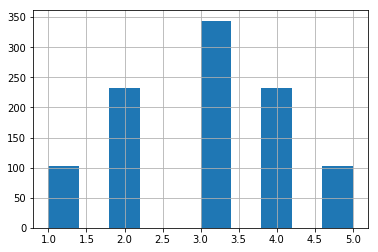

In [16]:
outcome.Class.hist()

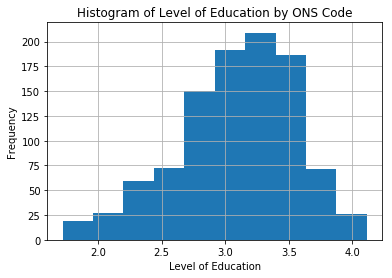

In [17]:
outcome.Score.hist()
plt.xlabel('Level of Education')
plt.ylabel('Frequency')
plt.title('Histogram of Level of Education by ONS Code')
plt.show()

The distribution above looks approximatley gaussian which is what would be expected from the levels of education across Scotland. 

In [18]:
census_utils.genchoropleth(outcome, 'Score')

The choropleth map above shows the education levels across scotland 

In [19]:
data = features.values
target = outcome['Class'].values 
data.shape, target.shape

((1012, 6), (1012,))

In [20]:
print(data[0])

[0.041392285983066796 0.5227670753064798 0.5967600700525394
 0.2442982456140351 0.19605263157894737 'S29000001']


In [21]:
data = data[:,:-1]
data.shape

(1012, 5)

I removed the last row in each colum as it was a label

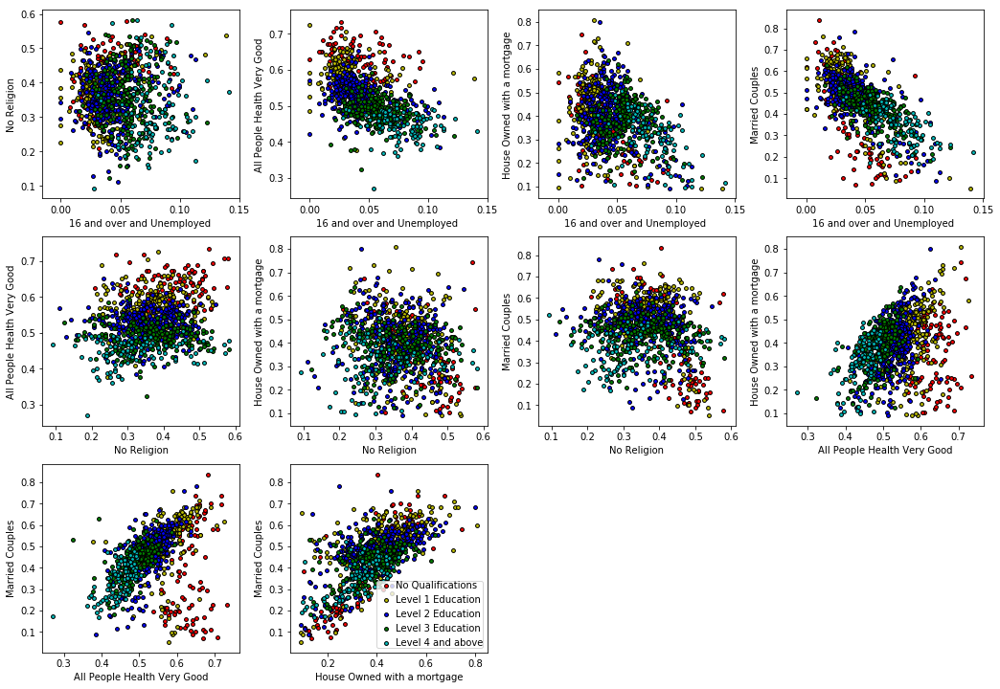

In [22]:
classes = [1, 2, 3, 4, 5]
flabels = ['16 and over and Unemployed ', 'No Religion', 'All People Health Very Good','House Owned with a mortgage', 'Married Couples']
clabels = ['No Qualifications', 'Level 1 Education', 'Level 2 Education', 'Level 3 Education', 'Level 4 and above']
census_utils.featureplot(data, target, classes, flabels, clabels)

From the feature plots above, there are some obvious correlations, anti-correlations and features with no correlations. The clearest correlations are married couples vs houses owned with a mortgage, loan or shared ownership. This makes a lot of sense as married couples would be the share ownership as well as having the combined income to afford a mortgage. 

The second is married couples and very good health which is also sensible. 

The most obvious anti-correlations is the married couples vs unemployment.

# Machine Learning 

The prediction at the start of the machine learning section is, that due to the correlation of some of the features the machine learning algorithm will be able to predict the education level of people across Scotland. 

# Decision Tree Model 

Multiple machine learning approaches were tried to find the model that best predicts Education level. Model leakage was considered and the features chosen were as unrelated to the target as possible. The features used in the visualisation are used in this section. 

In [23]:
data.shape , target.shape

((1012, 5), (1012,))

In [24]:
train_data, test_data, train_target, test_target = model_selection.train_test_split(
    data, target, test_size=0.2, random_state=0)

train_data.shape, train_target.shape, test_data.shape, test_target.shape

((809, 5), (809,), (203, 5), (203,))

A test size of 0.3 was tried by a more accurate result was found from a test size of 0.2

In [25]:
clf = tree.DecisionTreeClassifier(max_leaf_nodes=30)
fit = clf.fit(train_data, train_target)

['16 and over and Unemployed ', 'No Religion', 'All People Health Very Good', 'House Owned with a mortgage', 'Married Couples'] [1, 2, 3, 4, 5]


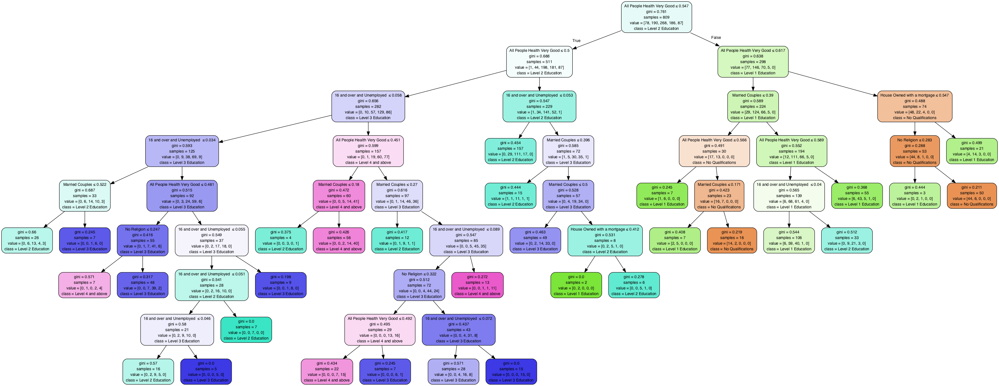

In [26]:
# plot decision tree 
print(flabels, classes)
graph = census_utils.plotDT(fit, flabels, clabels)
Image(graph.create_png())

In [27]:
expected = test_target
predicted = clf.predict(test_data)

In [28]:
report = metrics.classification_report(expected, predicted)
print(report)

             precision    recall  f1-score   support

          1       0.79      0.62      0.70        24
          2       0.52      0.67      0.58        42
          3       0.63      0.61      0.62        76
          4       0.62      0.52      0.56        46
          5       0.72      0.87      0.79        15

avg / total       0.63      0.62      0.62       203



This Machine Learning approach produced a 62% level of accuracy over the 5 education levels. As can be seen in the classification report the 3rd class (Level 2 Education) produced the most support,  the number of samples of the true response that lie in that class. However this class had a f1-score of 62%, compared with class 5 this was quite low which had one of 79%. This classification report says that our model is very good at prediction class 1 and class 5 values, quite good at predicting class 3 and not as good at predicting classes 2 and 4. 

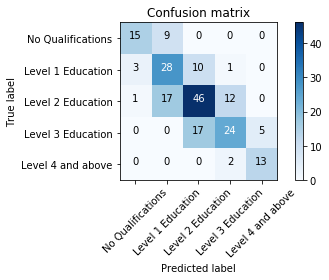

In [29]:
cm = metrics.confusion_matrix(expected, predicted)

census_utils.plot_cm(cm, clabels)
plt.show()

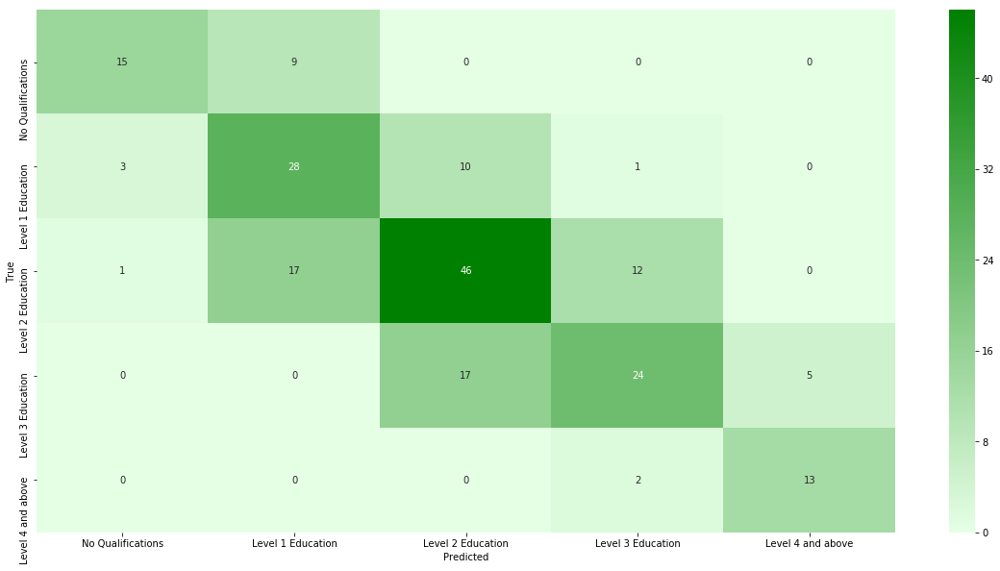

In [30]:
# heat map confusion matrix 
census_utils.heatmap(cm, labels=['Predicted', 'True'], classes=[clabels,clabels], normalize=False, size='large')
plt.show()

The confusion matrix heat map above shows that level 2 education (class 3) had the most data collected on it however it has got a very large amount of false positives and false negatives. Compared to level 4 and above (class 5) which has only 2 false negatives and 7 fals positives, class 3 is not as accurate. This is seen and discussed in in the classification report above.

In [31]:
# Cross validation 
scores = model_selection.cross_val_score(clf, data, target, cv=5)
print(scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

[0.51219512 0.54634146 0.60199005 0.45273632 0.54      ]
Accuracy: 0.53 (+/- 0.10)


In [32]:
clf.get_params()

{'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': 30,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'presort': False,
 'random_state': None,
 'splitter': 'best'}

In [33]:
# parameter search 
params = {'max_leaf_nodes' : [2, 3, 4, 5, 10, 20, 30, 50, 100], 
          'max_depth' : [1,2, 3, 4, 5,6,7,8,9,10]
         }
score = 'accuracy'
clf = model_selection.GridSearchCV(tree.DecisionTreeClassifier(), params, cv=5, scoring='%s' % score)
clf.fit(train_data, train_target)

print(clf.best_params_)
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']

{'max_depth': 6, 'max_leaf_nodes': 20}


In [34]:
clf2 = tree.DecisionTreeClassifier(max_depth=6, max_leaf_nodes = 20)
fit = clf2.fit(train_data, train_target)

expected = test_target
predicted = clf2.predict(test_data)

report = metrics.classification_report(expected, predicted)
print(report)

             precision    recall  f1-score   support

          1       0.73      0.79      0.76        24
          2       0.54      0.60      0.57        42
          3       0.62      0.61      0.61        76
          4       0.59      0.48      0.53        46
          5       0.65      0.87      0.74        15

avg / total       0.61      0.62      0.61       203



Applying this hyperparameter optimisation increased the accuracy of class 1, however all other classes reduced in f1-score and overall it reduced the average accuracy, so the original fit will be used. 

# Ensemble Method

In [35]:
clf = ensemble.RandomForestClassifier(n_estimators=10, max_features=2)
d = model_selection.train_test_split(data, target, test_size=0.3, random_state=0)
e, p = census_utils.runML(clf, d)
report = metrics.classification_report(e, p)
print(report)

             precision    recall  f1-score   support

          1       0.73      0.67      0.70        33
          2       0.48      0.51      0.49        69
          3       0.58      0.61      0.60       111
          4       0.56      0.55      0.56        67
          5       0.61      0.46      0.52        24

avg / total       0.57      0.57      0.57       304



As can be seen above in the classification report, the f1-scores have been reduced from the decision tree method. The other interesting factor in this report is that the trend of having the class 5 being the highest consistantly has been flipped on its head with the ensemble method.

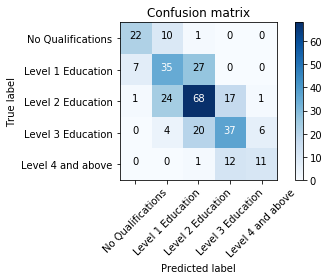

In [36]:
cm2 = metrics.confusion_matrix(e, p)

census_utils.plot_cm(cm2, clabels)
plt.show()

This can be seen clearly in the confusion matrix with level 4 and above education having 13 false negatives and 5 false positives compared to its 11 that are true and predicted. 

# Neural Network 

In [37]:
sc = StandardScaler()
data = sc.fit_transform(data)

/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [38]:
train_data, test_data, train_target, test_target = model_selection.train_test_split(
    data, target, test_size=0.2, random_state=0)

train_data.shape, train_target.shape, test_data.shape, test_target.shape

((809, 5), (809,), (203, 5), (203,))

In [39]:
clf3 = neural_network.MLPClassifier( max_iter = 300,verbose = True)

In [40]:
fit = clf3.fit(train_data, train_target)

Iteration 1, loss = 1.70965078
Iteration 2, loss = 1.64667052
Iteration 3, loss = 1.59429068
Iteration 4, loss = 1.54647748
Iteration 5, loss = 1.50382955
Iteration 6, loss = 1.46628732
Iteration 7, loss = 1.43152243
Iteration 8, loss = 1.40020442
Iteration 9, loss = 1.37225617
Iteration 10, loss = 1.34694415
Iteration 11, loss = 1.32353856
Iteration 12, loss = 1.30163331
Iteration 13, loss = 1.28226044
Iteration 14, loss = 1.26437599
Iteration 15, loss = 1.24684411
Iteration 16, loss = 1.23078765
Iteration 17, loss = 1.21609248
Iteration 18, loss = 1.20167136
Iteration 19, loss = 1.18791370
Iteration 20, loss = 1.17505416
Iteration 21, loss = 1.16425703
Iteration 22, loss = 1.15309207
Iteration 23, loss = 1.14122857
Iteration 24, loss = 1.13032828
Iteration 25, loss = 1.11969786
Iteration 26, loss = 1.11006797
Iteration 27, loss = 1.10159403
Iteration 28, loss = 1.09325935
Iteration 29, loss = 1.08506706
Iteration 30, loss = 1.07738200
Iteration 31, loss = 1.06882478
Iteration 32, los

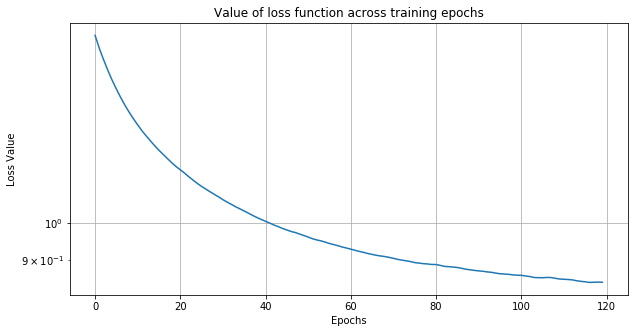

In [41]:
census_utils.lossplot(clf3.loss_curve_, scale ='log')
plt.show()

In [42]:
expected = test_target
predicted = clf3.predict(test_data)

report = metrics.classification_report(expected, predicted)
print(report)

             precision    recall  f1-score   support

          1       0.81      0.54      0.65        24
          2       0.51      0.62      0.56        42
          3       0.61      0.70      0.65        76
          4       0.69      0.52      0.59        46
          5       0.86      0.80      0.83        15

avg / total       0.65      0.63      0.63       203



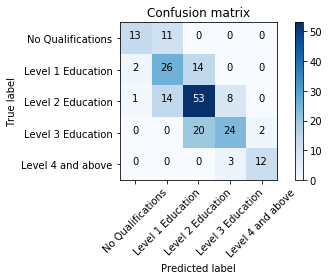

In [43]:
cm3 = metrics.confusion_matrix(expected, predicted)

census_utils.plot_cm(cm3, clabels)
plt.show()

As can be seen above in the classification report, the precission and recall of the model have both increased by a percentage point and the f1-score has remained exactly the same for this method compared to the decision tree method. This impovement can be seen in the confusion matrix by the reduction of both false positives and false negatives.

NN parameters
None
Split sample:
[0.01 0.02 0.03 0.04 0.05 0.06 0.07 0.08 0.09 0.1  0.2  0.3  0.4  0.5
 0.6  0.7  0.8  0.9  0.91 0.92 0.93 0.94 0.95 0.96 0.97 0.98 0.99]
Running with test size of: 0.01
Running with test size of: 0.02


/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Running with test size of: 0.03


/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Running with test size of: 0.04


/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Running with test size of: 0.05


/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Running with test size of: 0.06


/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Running with test size of: 0.07


/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Running with test size of: 0.08


/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Running with test size of: 0.09


/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Running with test size of: 0.10


/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Running with test size of: 0.20
Running with test size of: 0.30


/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Running with test size of: 0.40
Running with test size of: 0.50


/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Running with test size of: 0.60
Running with test size of: 0.70


/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Running with test size of: 0.80
Running with test size of: 0.90
Running with test size of: 0.91


/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Running with test size of: 0.92
Running with test size of: 0.93


/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Running with test size of: 0.94
Running with test size of: 0.95


/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Running with test size of: 0.96
Running with test size of: 0.97


/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Running with test size of: 0.98
Running with test size of: 0.99


/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/Users/tom/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/Users/tom/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:3449: UserWarning: Attempted to set non-positive ylimits for log-scale axis; invalid limits will be ignored.
  'Attempted to set non-positive ylimits for log-scale axis; '


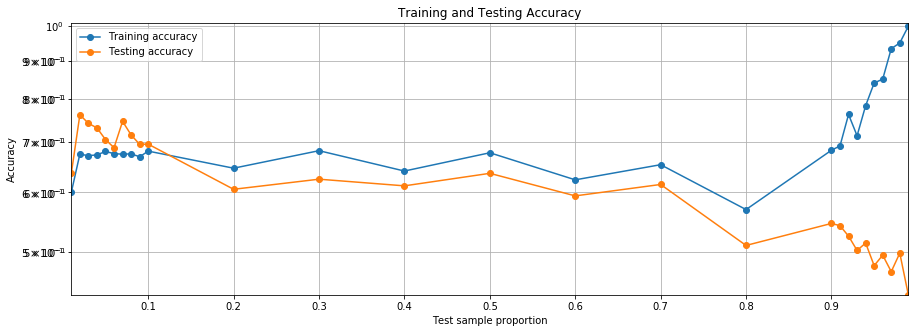

In [44]:
census_utils.compare_traintest(data, target, params = None, split=0, scale='log')

The graph above shows the change in accuracy from the training and testing data when different test sample proportions are used. The discrepancy at the end, when test sample proportion is around 0.9, is due to a large amount of test data and a very small amount of training data meaning that the training data accuracy will greatly increase.

In [45]:
# Cross validation 
scores = model_selection.cross_val_score(clf3, data, target, cv=5)
print(scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Iteration 1, loss = 1.53703243
Iteration 2, loss = 1.48792106
Iteration 3, loss = 1.44786340
Iteration 4, loss = 1.41273747
Iteration 5, loss = 1.38261216
Iteration 6, loss = 1.35538100
Iteration 7, loss = 1.33005523
Iteration 8, loss = 1.30823879
Iteration 9, loss = 1.28830921
Iteration 10, loss = 1.26841775
Iteration 11, loss = 1.25001963
Iteration 12, loss = 1.23243430
Iteration 13, loss = 1.21622078
Iteration 14, loss = 1.20078439
Iteration 15, loss = 1.18603801
Iteration 16, loss = 1.17119260
Iteration 17, loss = 1.15699670
Iteration 18, loss = 1.14407139
Iteration 19, loss = 1.13172846
Iteration 20, loss = 1.11916150
Iteration 21, loss = 1.10771427
Iteration 22, loss = 1.09656667
Iteration 23, loss = 1.08623960
Iteration 24, loss = 1.07645437
Iteration 25, loss = 1.06866841
Iteration 26, loss = 1.06027828
Iteration 27, loss = 1.05222535
Iteration 28, loss = 1.04507554
Iteration 29, loss = 1.03700040
Iteration 30, loss = 1.02947261
Iteration 31, loss = 1.02242631
Iteration 32, los

Iteration 34, loss = 1.01013388
Iteration 35, loss = 1.00346620
Iteration 36, loss = 0.99766317
Iteration 37, loss = 0.99260841
Iteration 38, loss = 0.98696810
Iteration 39, loss = 0.98159221
Iteration 40, loss = 0.97661228
Iteration 41, loss = 0.97261486
Iteration 42, loss = 0.96745728
Iteration 43, loss = 0.96250662
Iteration 44, loss = 0.95779626
Iteration 45, loss = 0.95331431
Iteration 46, loss = 0.94978012
Iteration 47, loss = 0.94597443
Iteration 48, loss = 0.94191118
Iteration 49, loss = 0.93867794
Iteration 50, loss = 0.93545684
Iteration 51, loss = 0.93144562
Iteration 52, loss = 0.92763548
Iteration 53, loss = 0.92407710
Iteration 54, loss = 0.92094006
Iteration 55, loss = 0.91795644
Iteration 56, loss = 0.91500431
Iteration 57, loss = 0.91201006
Iteration 58, loss = 0.90930548
Iteration 59, loss = 0.90571271
Iteration 60, loss = 0.90226915
Iteration 61, loss = 0.89909941
Iteration 62, loss = 0.89727551
Iteration 63, loss = 0.89434692
Iteration 64, loss = 0.89171388
Iteratio

Iteration 3, loss = 1.54379477
Iteration 4, loss = 1.49196541
Iteration 5, loss = 1.44751829
Iteration 6, loss = 1.40865181
Iteration 7, loss = 1.37422760
Iteration 8, loss = 1.34233173
Iteration 9, loss = 1.31315535
Iteration 10, loss = 1.28611235
Iteration 11, loss = 1.26058938
Iteration 12, loss = 1.23775228
Iteration 13, loss = 1.21639806
Iteration 14, loss = 1.19673807
Iteration 15, loss = 1.17873723
Iteration 16, loss = 1.16235344
Iteration 17, loss = 1.14746081
Iteration 18, loss = 1.13270587
Iteration 19, loss = 1.11887148
Iteration 20, loss = 1.10503888
Iteration 21, loss = 1.09248176
Iteration 22, loss = 1.08052193
Iteration 23, loss = 1.06934208
Iteration 24, loss = 1.05897423
Iteration 25, loss = 1.04910826
Iteration 26, loss = 1.03967521
Iteration 27, loss = 1.03091927
Iteration 28, loss = 1.02230406
Iteration 29, loss = 1.01392105
Iteration 30, loss = 1.00566029
Iteration 31, loss = 0.99741608
Iteration 32, loss = 0.99054569
Iteration 33, loss = 0.98346887
Iteration 34, l

As can be seen above, the cross validation accuracy has increased in accuracy from 0.53 with a 0.1 uncertainty to 0.58 with a 0.09 accuracy, which is a substantial increase. We can conclued that the neural network model can predict education level with the given features to the greatest accuracy.

# Conclusions

The features used were chosen as I had initially assumed that they would be lead to the predicition of education level. After seeing the feature plots and observing both correlation and anti-correalation it was assumed that the algorithm would be able to predict education level. 

By using a decision tree, ensemble method and a neural network I was able to determine the optimal method, that being a neural network. However the highest accuracy achieved was just 62% which is marginally better than 50/50 chance. The study did prove my initial belief as the features chosen were able to predict the desired target better than chance. 

If the method would be improved, more features would be used and, the difference that adding or taking away individual features gave to the accuracy would be investigated.

To perform a more extensive study, age could be used and different age demographics could be investigated in relation to education level. 